## Note, this needs to run in a NON_arc environment with GDAL installed, 
because ESRI and Gdal dont play nice

In [1]:
#### import modules

# make the screen bigger!
from IPython.display import display, HTML
display(HTML(data=""" <style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 85%; }
    div#maintoolbar-container { width: 99%; } </style> """))

import numpy as np
import os
import sys
import pandas as pd
import gdal

%matplotlib notebook

# this is a list of additional functions to load up, as to not clutter the script
%run ../../Std_input/COMMON/plot_and_table_functions

# Land use scenarios, no climate Figures

<IPython.core.display.Javascript object>


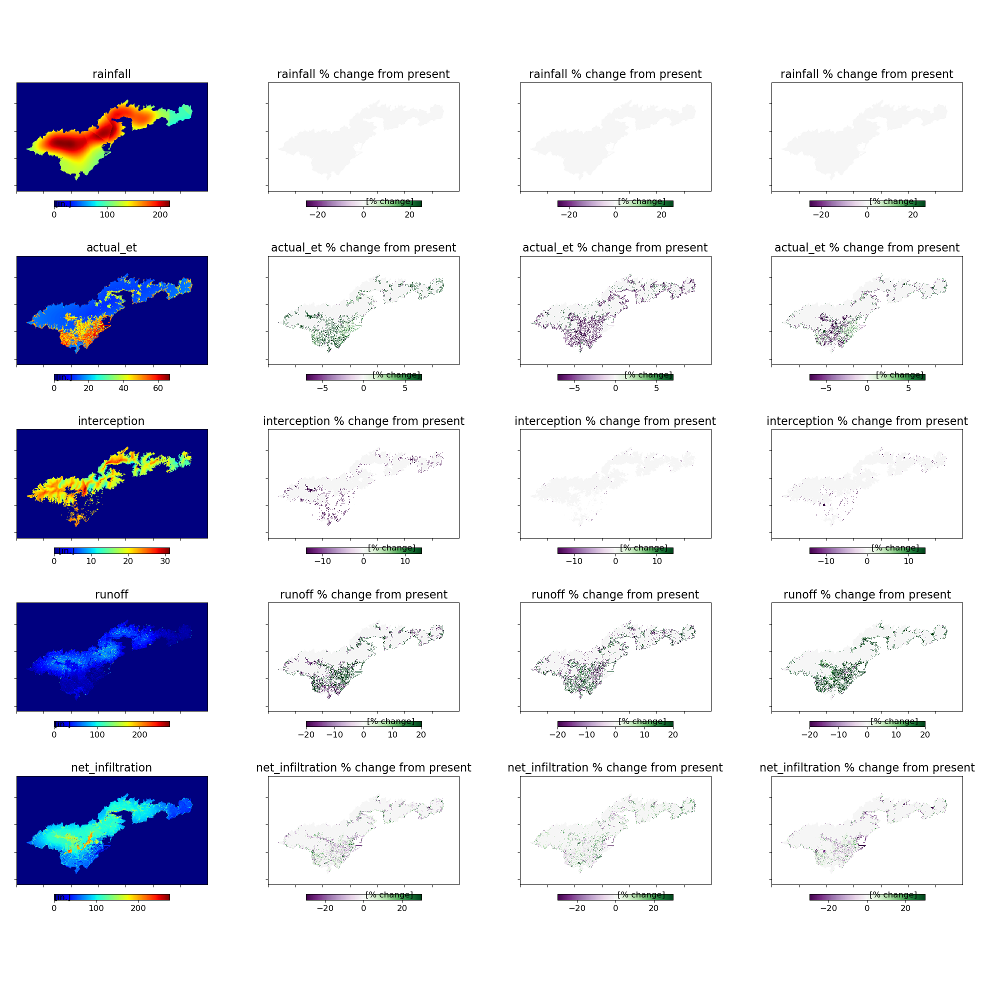


reading in ..\1_Original_run_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\2_scn1_noclimate_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...


<ipython-input-38-02a761542ddb>:47: RuntimeWarning: invalid value encountered in true_divide
  var=(rfs_dataSCEN/rfs_data-1)*100



reading in ..\3_scn2_noclimate_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\4_scn3_noclimate_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\1_Original_run_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\2_scn1_noclimate_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\3_scn2_noclimate_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...


<ipython-input-38-02a761542ddb>:47: RuntimeWarning: divide by zero encountered in true_divide
  var=(rfs_dataSCEN/rfs_data-1)*100


creating a grid of xy coordinates in the original projection...

reading in ..\4_scn3_noclimate_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\1_Original_run_out\post_prcessed_with_MFR\interception_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\2_scn1_noclimate_out\post_prcessed_with_MFR\interception_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\3_scn2_noclimate_out\post_prcessed_with_MFR\interception_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\4_scn3_noclimate_out\post_prcessed_with_MFR\interception_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\1_Original_run_out\post_prcessed_with_MFR\runoff_annual.asc into numpy array...
creating a 

In [38]:
Desired_files = ['rainfall', 'actual_et',  'interception', 'runoff', 'net_infiltration'] # 'delta_soil_storage',  'irrigation', 

scenario_list = ["2_scn1_noclimate_out", "3_scn2_noclimate_out", "4_scn3_noclimate_out"]

maxlist = [25, 7, 14, 20, 30]

fig = plt.figure(num=None, figsize=(20, 20), dpi=100, facecolor='w', edgecolor='k')

plot_colsN = len(scenario_list)+1
plot_rowsN = len(Desired_files)

for idx, f in enumerate(Desired_files): 
    
    # Base case
    f_nam = f +"_annual.asc"
    Scenario_path = os.path.join("..", "1_Original_run_out", "post_prcessed_with_MFR", f_nam)
    
    ax1 = fig.add_subplot(plot_rowsN,plot_colsN, idx*plot_colsN + 1)

    rfs_data, rfs_gt, rfs_proj, rfs_xy = read_raster(Scenario_path)
    rfs_data[rfs_data > 300] = 0  
    var=rfs_data 
    x=rfs_xy[0]
    y=rfs_xy[1]
    minz = np.nanmin(var)
    maxz = np.nanmax(var)
    title= f ; barlabel='[in.]'

    myplot = plt.imshow( var, interpolation='nearest', cmap='jet', extent=(np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)) )
    mybar = plt.colorbar( myplot, ax = ax1, orientation = 'horizontal', fraction = 0.03, pad=.05)
    myax = mybar.ax
    mybar.ax.tick_params(labelsize=12)
    plt.clim(minz, maxz)
    plt.title( title, fontsize=16 )
    myax.text(1.1, -1.5, barlabel,rotation=0,size=12)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    
    # iterate over scenarios
    for scenN, da_scenario in enumerate(scenario_list):
        
        Scenario_path = os.path.join("..", da_scenario, "post_prcessed_with_MFR", f_nam)
        
        ax2 = fig.add_subplot(plot_rowsN,plot_colsN, idx*plot_colsN + (scenN+2))

        rfs_dataSCEN, rfs_gtSCEN, rfs_projSCEN, rfs_xySCEN = read_raster(Scenario_path)
        var=(rfs_dataSCEN/rfs_data-1)*100
        x=rfs_xySCEN[0]
        y=rfs_xySCEN[1]
        minz = np.nanmin(var)
        maxz = np.nanmax(var)
        title= f ; barlabel='[% change]'

        myplot = plt.imshow( var, interpolation='nearest', cmap='PRGn', extent=(np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)) )
        mybar = plt.colorbar( myplot, ax = ax2, orientation = 'horizontal', fraction = 0.03, pad= .05)
        myax = mybar.ax
        mybar.ax.tick_params(labelsize=12)
        plt.clim(-maxlist[idx], maxlist[idx])
        plt.title( title+" % change from present", fontsize=16 )
        myax.text(1.1, -1.5, barlabel,rotation=0,size=12)
        ax2.set_xticklabels([])
        ax2.set_yticklabels([])

    
plt.tight_layout(pad=2)
fig.subplots_adjust(hspace=-0.1, bottom=0.1)
plt.savefig(os.path.join("..", "Results", 'Scenario_Figs_no_climate.png'))

### Land use scenarios, Watershed no climate Tables

In [39]:
# generte summary frame of the "Base Case" scenario, need one for high res and one for low-res climate downscaled
Base_case_path = os.path.join("..", "1_Original_run_out", "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
base_frame = pd.read_csv(Base_case_path, index_col=0)
base_frame = base_frame.set_index("SHED_NAME")

#Loop over each scenario to geenerate summary frames 
Summary_dic_WS = {}                 # to be sored in dictionary
for  i in scenario_list:
    Scenario_path = os.path.join("..", i, "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
    data = pd.read_csv(Scenario_path, index_col=0)  # read in each scenario file from model run
    data = data.set_index("SHED_NAME")
    
    compcomp = ((base_frame-data)/base_frame)
    
    Summary_dic_WS[i] = compcomp   # this contains data frames of regional summaries for each scenaro
    
#Summary_dic_WS['3_scn2_noclimate_out']  # 2_scn1_noclimate_out   3_scn2_noclimate_out

### Land use scenarios, Regional no climate Tables

In [3]:
# Calculate changes in scenarios numerically

# set up consolidation parametres 
regions = ["TFplain", "NWest", "Central", "East"]

TFplain_list = ["Nuuuli Pala", "Leone", "Tafuna Plain", "Fagatele - Larsen"]
NWest_list =  ["Fagasa", "Aasu", "Aoloau Sisifo", "Aoloau Sasae", "Fagamalo", "Maloata", "Fagalii", "Afao - Asili", "Poloa", "Nua - Seetaga", "Amanave"]
Central_list = ["Fagatuitui - Vaaogeoge", "Vatia", "Afono", "Pago Pago Harbor", "Laulii - Aumi", "Fagaalu", "Matuu - Faganeanea"]
East_list = ["Tula", "Onenoa", "Masefau", "Aoa", "Masausi", "Sailele", "Alao", "Fagaitua", "Auasi", "Amouli", "Alega"]

# generte summary frame of the "Base Case" scenario, need one for high res and one for low-res climate downscaled
Base_case_path = os.path.join("..", "1_Original_run_out", "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
data = pd.read_csv(Base_case_path, index_col=0)
TFplain = data[data["SHED_NAME"].isin(TFplain_list)].sum(axis=0).to_frame().transpose()
NWest = data[data["SHED_NAME"].isin(NWest_list)].sum(axis=0).to_frame().transpose()
Central = data[data["SHED_NAME"].isin(Central_list)].sum(axis=0).to_frame().transpose()
East = data[data["SHED_NAME"].isin(East_list)].sum(axis=0).to_frame().transpose()
TFplain['SHED_NAME'] = "TFplain"
NWest['SHED_NAME'] = "NWest"
Central['SHED_NAME'] = "Central"
East['SHED_NAME'] = "East"

Base_Case_frame = pd.concat([TFplain, NWest, Central, East])


#Loop over each scenario to geenerate summary frames 
Summary_dic = {}                 # to be sored in dictionary
for  i in scenario_list:
    Scenario_path = os.path.join("..", i, "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
    data = pd.read_csv(Scenario_path, index_col=0)  # read in each scenario file from model run
    # use pandas magic to summarize them
    TFplain = data[data["SHED_NAME"].isin(TFplain_list)].sum(axis=0).to_frame().transpose()
    NWest = data[data["SHED_NAME"].isin(NWest_list)].sum(axis=0).to_frame().transpose()
    Central = data[data["SHED_NAME"].isin(Central_list)].sum(axis=0).to_frame().transpose()
    East = data[data["SHED_NAME"].isin(East_list)].sum(axis=0).to_frame().transpose()
    TFplain['SHED_NAME'] = "TFplain"
    NWest['SHED_NAME'] = "NWest"
    Central['SHED_NAME'] = "Central"
    East['SHED_NAME'] = "East"
    
    Reg_sum_frame = pd.concat([TFplain, NWest, Central, East])
    
    Summary_dic[i] = Reg_sum_frame   # this contains data frames of regional summaries for each scenaro
    
    
# Calculate the % difference betweeen base cases and each scenario.
base_frame = Base_Case_frame.set_index("SHED_NAME")
merge_frame = base_frame.transpose().copy()             # create a dataframe to join things onto

for i in Summary_dic.keys():                            # for each scenario basically get the scenrio/base case values
    comp_frame = Summary_dic[i].set_index("SHED_NAME")
    compcomp = (round(comp_frame/base_frame)).transpose()
    compcomp = compcomp.rename(columns={"TFplain":"TFplain_S_{}".format(i.split("_")[0]),
                                       "NWest":"NWest_S_{}".format(i.split("_")[0]),
                                       "Central":"Central_S_{}".format(i.split("_")[0]),
                                       "East":"East_S_{}".format(i.split("_")[0]),})
    
    merge_frame =  merge_frame.join(compcomp, how="inner")   # merge them to gether for inspection, and next step
    merge_frame.to_csv(os.path.join("..", "Results", "Scenario_Table_Regional_no_climate.csv"))
    
### PLOT THEM WITH BAR GRAPH

In [4]:
merge_frame

SHED_NAME,TFplain,NWest,Central,East,TFplain_S_2,NWest_S_2,Central_S_2,East_S_2,TFplain_S_3,NWest_S_3,Central_S_3,East_S_3,TFplain_S_4,NWest_S_4,Central_S_4,East_S_4
actual_et,116021,40850.6,39777.1,28584.1,1.08398,1.08654,1.03844,1.10798,0.886732,0.920662,0.885476,0.865626,1.00443,1.00408,0.995818,1.02009
direct_net_infiltation,38583.6,3575.49,7627.2,5916.29,1.13027,1.18774,1.22007,1.16647,0.958514,0.935467,0.924366,0.942777,1.09982,1.12517,1.14672,1.11099
direct_soil_moisture,1473.9,139.874,611.688,171.189,3.22025,3.0597,2.09898,3.5122,0.609065,0.41791,0.527304,0.414634,2.71176,2.68657,1.62969,2.56098
interception,29463.4,42598.6,32758.2,19716.7,0.829608,0.947452,0.979967,0.914975,1.19985,1.04094,1.0622,1.08922,0.989181,0.997849,0.999945,0.990448
net_infiltration,326970,234412,217979,98616.8,0.995765,0.997509,0.996754,0.995443,1.00745,1.00448,1.00187,1.0137,0.992292,0.997554,0.990193,0.994188
rainfall,529360,408201,375624,164522,1,1,1,1,1,1,1,1,1,1,1,1
runoff,88669.9,102533,93932.7,24247.2,1.06469,1.00204,1.02795,1.02121,1.01384,0.998178,1.00652,1.00837,1.10719,1.01274,1.04669,1.04895


### Land use scenarios, Island no climate Tables

In [31]:
# Whole island summary

# generte summary frame of the "Base Case" scenario, need one for high res and one for low-res climate downscaled
Base_case_path = os.path.join("..", "1_Original_run_out", "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
Bdata = pd.read_csv(Base_case_path, index_col=0)
base_summed = Bdata.sum(axis=0)# .to_frame().transpose()    # sum all the columns 
base_summed['SHED_NAME'] = "Base"
   
#Loop over each scenario to geenerate summary frames 

Comp_frame_1 = base_summed.copy()
for  i in scenario_list:
    Scenario_path = os.path.join("..", i, "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
    data = pd.read_csv(Scenario_path, index_col=0)  # read in each scenario file from model run
    Scen_summed = data.sum(axis=0)
    Scen_summed['SHED_NAME'] = i
    
    Comp_frame_1 = pd.concat([Comp_frame_1, Scen_summed], axis=1)
    Comp_frame_1.columns = Comp_frame_1.loc['SHED_NAME']
    
Comp_frame_1 =  Comp_frame_1.drop('SHED_NAME', axis=0)
    
Comp_frame_island = Comp_frame_1.copy()
for i in Comp_frame_1.columns[1:]: 
    Comp_frame_1["PctCng_{}".format(i)] = (Comp_frame_1[i]-Comp_frame_1["Base"])/Comp_frame_1["Base"]
    Comp_frame_1.drop(i, axis=1, inplace=True)
    
Comp_frame_1.to_csv(os.path.join("..", "Results", "Scenario_Table_Island_no_climate.csv"))

Comp_frame_1

SHED_NAME,Base,PctCng_2_scn1_noclimate_out,PctCng_3_scn2_noclimate_out,PctCng_4_scn3_noclimate_out
actual_et,225232,0.0794473,-0.110014,0.00483444
direct_net_infiltation,55702.6,0.150099,-0.0493126,0.109057
direct_soil_moisture,2396.65,1.94556,-0.436847,1.42334
interception,124537,-0.0770167,0.0917743,-0.00482197
net_infiltration,877977,-0.00355994,0.00597341,-0.00661122
rainfall,1.47771e+06,0,0,0
runoff,309383,0.0293644,0.00599729,0.0529575


# Future Climate Scenarios Figures

In [33]:
Desired_files = ['rainfall', 'actual_et',  'interception', 'runoff', 'net_infiltration'] # 'delta_soil_storage',  'irrigation', 

scenario_list2 = [ "6_FutureClimate_RCP45_out", "7_FutureClimate_RCP85_out", "8_Future_Present_Scn1_out", 
                 "9_Future_Present_Scn2_out", '10_Future_Present_Scn3_out', '11_Future_RCP4.5_Scn1_out',
                  '12_Future_RCP4.5_Scn2_out', '13_Future_RCP4.5_Scn3_out', '14_Future_RCP8.5_Scn1_out',
                  '15_Future_RCP8.5_Scn2_out', '16_Future_RCP8.5_Scn3_out']

maxlist = [25, 7, 14, 20, 30]


fig = plt.figure(num=None, figsize=(60, 20), dpi=300, facecolor='w', edgecolor='k')

plot_colsN = len(scenario_list2)+1
plot_rowsN = len(Desired_files)

for idx, f in enumerate(Desired_files): 
    
    # Base case
    f_nam = f +"_annual.asc"
    Scenario_path = os.path.join("..", "5_FutureClimate_BASE_out", "post_prcessed_with_MFR", f_nam)
    
    ax1 = fig.add_subplot(plot_rowsN,plot_colsN, idx*plot_colsN + 1)

    rfs_data, rfs_gt, rfs_proj, rfs_xy = read_raster(Scenario_path)
    rfs_data[rfs_data > 300] = 0  
    var=rfs_data 
    x=rfs_xy[0]
    y=rfs_xy[1]
    minz = np.nanmin(var)
    maxz = np.nanmax(var)
    title= f ; barlabel='[in.]'

    myplot = plt.imshow( var, interpolation='nearest', cmap='jet', extent=(np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)) )
    mybar = plt.colorbar( myplot, ax = ax1, orientation = 'horizontal', fraction = 0.03, pad=.05)
    myax = mybar.ax
    mybar.ax.tick_params(labelsize=12)
    plt.clim(minz, maxz)
    plt.title( title, fontsize=16 )
    myax.text(1.1, -1.5, barlabel,rotation=0,size=12)
    ax1.set_xticklabels([])
    ax1.set_yticklabels([])
    
    
    # iterate over scenarios
    for scenN, da_scenario in enumerate(scenario_list2):
        
        Scenario_path = os.path.join("..", da_scenario, "post_prcessed_with_MFR", f_nam)
        
        ax2 = fig.add_subplot(plot_rowsN,plot_colsN, idx*plot_colsN + (scenN+2))

        rfs_dataSCEN, rfs_gtSCEN, rfs_projSCEN, rfs_xySCEN = read_raster(Scenario_path)
        var=(rfs_dataSCEN/rfs_data-1)*100
        x=rfs_xySCEN[0]
        y=rfs_xySCEN[1]
        minz = np.nanmin(var)
        maxz = np.nanmax(var)
        title= f ; barlabel='[% change]'

        myplot = plt.imshow( var, interpolation='nearest', cmap='PRGn', extent=(np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)) )
        mybar = plt.colorbar( myplot, ax = ax2, orientation = 'horizontal', fraction = 0.03, pad= .05)
        myax = mybar.ax
        mybar.ax.tick_params(labelsize=12)
        plt.clim(-maxlist[idx], maxlist[idx])
        plt.title( title+" % change from present", fontsize=16 )
        myax.text(1.1, -1.5, barlabel,rotation=0,size=12)
        ax2.set_xticklabels([])
        ax2.set_yticklabels([])

    
plt.tight_layout(pad=2)
fig.subplots_adjust(hspace=-0.1, bottom=0.1)
plt.savefig(os.path.join("..", "Results", 'Scenario_Figs_FutureClimate.png'))


<IPython.core.display.Javascript object>


reading in ..\5_FutureClimate_BASE_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\6_FutureClimate_RCP45_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\7_FutureClimate_RCP85_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...


<ipython-input-33-d0bbd27fc597>:51: RuntimeWarning: invalid value encountered in true_divide
  var=(rfs_dataSCEN/rfs_data-1)*100



reading in ..\8_Future_Present_Scn1_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\9_Future_Present_Scn2_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\10_Future_Present_Scn3_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\11_Future_RCP4.5_Scn1_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\12_Future_RCP4.5_Scn2_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\13_Future_RCP4.5_Scn3_out\post_prcessed_with_MFR\rainfall_annual.asc into numpy array...
creating a grid of xy coordinates in the original proje

<ipython-input-33-d0bbd27fc597>:51: RuntimeWarning: divide by zero encountered in true_divide
  var=(rfs_dataSCEN/rfs_data-1)*100



reading in ..\9_Future_Present_Scn2_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\10_Future_Present_Scn3_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\11_Future_RCP4.5_Scn1_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\12_Future_RCP4.5_Scn2_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\13_Future_RCP4.5_Scn3_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original projection...

reading in ..\14_Future_RCP8.5_Scn1_out\post_prcessed_with_MFR\actual_et_annual.asc into numpy array...
creating a grid of xy coordinates in the original

##  Future Climate Scenarios Tables

In [34]:
# Calculate changes in scenarios numerically

# set up consolidation parametres 
regions = ["TFplain", "NWest", "Central", "East"]

TFplain_list = ["Nuuuli Pala", "Leone", "Tafuna Plain", "Fagatele - Larsen"]
NWest_list =  ["Fagasa", "Aasu", "Aoloau Sisifo", "Aoloau Sasae", "Fagamalo", "Maloata", "Fagalii", "Afao - Asili", "Poloa", "Nua - Seetaga", "Amanave"]
Central_list = ["Fagatuitui - Vaaogeoge", "Vatia", "Afono", "Pago Pago Harbor", "Laulii - Aumi", "Fagaalu", "Matuu - Faganeanea"]
East_list = ["Tula", "Onenoa", "Masefau", "Aoa", "Masausi", "Sailele", "Alao", "Fagaitua", "Auasi", "Amouli", "Alega"]



# generte summary frame of the "Base Case" scenario, need one for high res and one for low-res climate downscaled
Base_case_path = os.path.join("..", "5_FutureClimate_BASE_out", "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
data = pd.read_csv(Base_case_path, index_col=0)
TFplain = data[data["SHED_NAME"].isin(TFplain_list)].sum(axis=0).to_frame().transpose()
NWest = data[data["SHED_NAME"].isin(NWest_list)].sum(axis=0).to_frame().transpose()
Central = data[data["SHED_NAME"].isin(Central_list)].sum(axis=0).to_frame().transpose()
East = data[data["SHED_NAME"].isin(East_list)].sum(axis=0).to_frame().transpose()
TFplain['SHED_NAME'] = "TFplain"
NWest['SHED_NAME'] = "NWest"
Central['SHED_NAME'] = "Central"
East['SHED_NAME'] = "East"

Base_Case_frame = pd.concat([TFplain, NWest, Central, East])


#Loop over each scenario to geenerate summary frames 
Summary_dic = {}                 # to be sored in dictionary
for  i in scenario_list2:
    Scenario_path = os.path.join("..", i, "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
    data = pd.read_csv(Scenario_path, index_col=0)  # read in each scenario file from model run
    # use pandas magic to summarize them
    TFplain = data[data["SHED_NAME"].isin(TFplain_list)].sum(axis=0).to_frame().transpose()
    NWest = data[data["SHED_NAME"].isin(NWest_list)].sum(axis=0).to_frame().transpose()
    Central = data[data["SHED_NAME"].isin(Central_list)].sum(axis=0).to_frame().transpose()
    East = data[data["SHED_NAME"].isin(East_list)].sum(axis=0).to_frame().transpose()
    TFplain['SHED_NAME'] = "TFplain"
    NWest['SHED_NAME'] = "NWest"
    Central['SHED_NAME'] = "Central"
    East['SHED_NAME'] = "East"
    
    Reg_sum_frame = pd.concat([TFplain, NWest, Central, East])
    
    Summary_dic[i] = Reg_sum_frame   # this contains data frames of regional summaries for each scenaro
    
    
# Calculate the % difference betweeen base cases and each scenario.
base_frame = Base_Case_frame.set_index("SHED_NAME")
merge_frame = base_frame.transpose().copy()             # create a dataframe to join things onto

for i in Summary_dic.keys():                            # for each scenario basically get the scenrio/base case values
    comp_frame = Summary_dic[i].set_index("SHED_NAME")
    compcomp = (round(comp_frame/base_frame)).transpose()
    compcomp = compcomp.rename(columns={"TFplain":"TFplain_S_{}".format(i.split("_")[0]),
                                       "NWest":"NWest_S_{}".format(i.split("_")[0]),
                                       "Central":"Central_S_{}".format(i.split("_")[0]),
                                       "East":"East_S_{}".format(i.split("_")[0]),})
    
    merge_frame =  merge_frame.join(compcomp, how="inner")   # merge them to gether for inspection, and next step
    merge_frame.to_csv(os.path.join("..", "Results", "Scenario_Table_Regional_FutureClimate.csv"))
    
### PLOT THEM WITH BAR GRAPH

In [40]:
# Whole island summary with climate

# generte summary frame of the "Base Case" scenario, need one for high res and one for low-res climate downscaled
Base_case_path = os.path.join("..", "5_FutureClimate_BASE_out", "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
Bdata = pd.read_csv(Base_case_path, index_col=0)
base_summed = Bdata.sum(axis=0)# .to_frame().transpose()    # sum all the columns 
base_summed['SHED_NAME'] = "Base"
   
#Loop over each scenario to geenerate summary frames 

Comp_frame_1 = base_summed.copy()
for  i in scenario_list2:
    Scenario_path = os.path.join("..", i, "post_prcessed_with_MFR", "watershed_summary_stats_volume_m3pd.csv")
    data = pd.read_csv(Scenario_path, index_col=0)  # read in each scenario file from model run
    Scen_summed = data.sum(axis=0)
    Scen_summed['SHED_NAME'] = i
    
    Comp_frame_1 = pd.concat([Comp_frame_1, Scen_summed], axis=1)
    Comp_frame_1.columns = Comp_frame_1.loc['SHED_NAME']
    
Comp_frame_1 =  Comp_frame_1.drop('SHED_NAME', axis=0)
    
Comp_frame_island = Comp_frame_1.copy()
for i in Comp_frame_1.columns[1:]: 
    Comp_frame_1["PctCng_{}".format(i)] = (Comp_frame_1[i]-Comp_frame_1["Base"])/Comp_frame_1["Base"]
    Comp_frame_1.drop(i, axis=1, inplace=True)
    
Comp_frame_1.to_csv(os.path.join("..", "Results", "Scenario_Table_Island_FutureClimate.csv"))

Comp_frame_1

SHED_NAME,Base,PctCng_6_FutureClimate_RCP45_out,PctCng_7_FutureClimate_RCP85_out,PctCng_8_Future_Present_Scn1_out,PctCng_9_Future_Present_Scn2_out,PctCng_10_Future_Present_Scn3_out,PctCng_11_Future_RCP4.5_Scn1_out,PctCng_12_Future_RCP4.5_Scn2_out,PctCng_13_Future_RCP4.5_Scn3_out,PctCng_14_Future_RCP8.5_Scn1_out,PctCng_15_Future_RCP8.5_Scn2_out,PctCng_16_Future_RCP8.5_Scn3_out
actual_et,221083,0.0120625,0.00637866,0.0796487,-0.107462,0.00616233,0.092879,-0.0982056,0.0178313,0.0866623,-0.102579,0.0123038
direct_net_infiltation,40877.4,0.073831,0.0562222,0.194833,-0.0664448,0.13353,0.271124,0.00653404,0.211002,0.25278,-0.0106425,0.192242
direct_soil_moisture,2396.65,0,0,1.94556,-0.436847,1.42334,1.94556,-0.436847,1.42334,1.94556,-0.436847,1.42334
interception,98682,0.0638388,0.0385227,-0.0805513,0.0970455,-0.00515797,-0.0221775,0.167059,0.058267,-0.045088,0.139046,0.0331444
net_infiltration,502305,0.200588,0.12176,0.00111096,0.0154268,0.0060477,0.199377,0.215245,0.201804,0.121625,0.136586,0.125124
rainfall,853166,0.178535,0.1091,0,0,0,0.178535,0.178535,0.178535,0.1091,0.1091,0.1091
runoff,64056.9,0.725474,0.473397,0.0495955,0.0123708,0.0834307,0.801041,0.741438,0.855824,0.537871,0.48786,0.583207


# Calculate results for base case in Million LITERS per day

In [47]:
# generte summary frame of the "Base Case" scenario, need one for high res and one for low-res climate downscaled
Base_case_path = os.path.join("..", "1_Original_run_out", "post_prcessed_with_MFR", "watershed_summary_stats_volumes_MGD.csv")
Bdata = pd.read_csv(Base_case_path, index_col=0)
base_summed = Bdata.sum(axis=0)# .to_frame().transpose()    # sum all the columns 
base_summed['SHED_NAME'] = "Base"

# Convert to Mil Liters/d
base_summed[:-1]*3.78541

actual_et                 225.232
direct_net_infiltation    55.7025
direct_soil_moisture      2.39664
interception              124.537
net_infiltration          877.977
rainfall                  1477.71
runoff                    309.383
dtype: object

In [48]:
# Display each component as a percentage of total inputs
tot_imps = base_summed.loc['rainfall']*3.78541 + base_summed.loc['direct_net_infiltation']*3.78541

(base_summed[:-1]*3.78541)/tot_imps

actual_et                   0.146883
direct_net_infiltation      0.036326
direct_soil_moisture      0.00156295
interception               0.0812157
net_infiltration            0.572565
rainfall                    0.963674
runoff                      0.201761
dtype: object

In [49]:
tot_oups = base_summed.loc['actual_et']*3.78541 + base_summed.loc['interception']*3.78541   +  base_summed.loc['net_infiltration']*3.78541 + base_summed.loc['runoff']*3.78541
tot_oups

1537.1284743821336

In [88]:
import xarray as xr
import datetime
import re
import netCDF4 as nc

var = []; tot = []; nclist = []

Control_File_Name = '1_Tutuila_cal_controlFile.ctl'
input_folder = os.path.join("..", "input")  


# Parameters
Desired_files = ['actual_et',  'direct_net_infiltation', 'direct_soil_moisture',
             'interception', 'net_infiltration', 'rainfall', 'runoff'] # 'delta_soil_storage',  'irrigation', 

output_folder = os.path.join("..", "1_Original_run_out")


def mod_ctrl_file_cellSize(Control_File_Name):
    
    # modify the control file gridsize for the given run   (note this uses dimensions from the rainfall adjustment grid in april)
    with open(os.path.join(input_folder, 'RF_adj_grids', 'rfadj_apr.asc'), 'r') as dims_file:   # open an ASC file and get the dimenstions out of it 
        dimsfile1 = dims_file.read().splitlines(True)
        x_dim = float(re.findall('\d+', dimsfile1[0])[-1])    
        y_dim = float(re.findall('\d+', dimsfile1[1])[-1])
        cel_size = float(re.findall('\d+', dimsfile1[4])[-1])

    with open(os.path.join('.', Control_File_Name), 'r') as fin:   # open file 
        data = fin.read().splitlines(True)
    with open(os.path.join('.', Control_File_Name), 'w') as fout:     # delete first line
        fout.writelines(data[1:])
    new_first = 'GRID {} {} 515000. 8409000. {} '.format(x_dim, y_dim, cel_size)  # new first line 
    with open(os.path.join('.', Control_File_Name), 'r+') as file:                # add in new first line and save file  
        file_data = file.read()
        file. seek(0, 0)
        file. write(new_first + '\n' + file_data)
        
        return x_dim, y_dim, cel_size

    
    # changes the cell size in the ctrl file to whatever the rainfall adjustment grid size is
x_dim, y_dim, cel_size = mod_ctrl_file_cellSize(Control_File_Name)
    
# functions
def create_file_reference( component_name ):
    '''
    This is a simple convenience function that will form a path and filename to a
    given water budget component
    '''
    # specify the prefix, path to SWB2 output, timeframe, and resolution
    #output_path = os.path.join(os.getcwd(), "output")
    #prefix      = '\\'

# pull start and end dates from control file
    with open(os.path.join('.', Control_File_Name), 'r') as fin:   # open file 
        date_find = fin.read().splitlines(True)
    start_year = datetime.datetime.strptime(date_find[-2].split(" ")[1], "%m/%d/%Y").strftime("%Y-%m-%d")
    end_year =  datetime.datetime.strptime(date_find[-1].split(" ")[1], "%m/%d/%Y").strftime("%Y-%m-%d")

    ncol        = str(int(x_dim))
    nrow        = str(int(y_dim))
    return(  component_name + '__' + start_year + '_' 
          + end_year + '__' + nrow + '_by_' + ncol + '.nc' )

# some other functions to post process stuff


# Post process the files again, this time with the MFR added 
outspace = os.path.join(output_folder, 'post_prcessed_with_MFR')
if not os.path.exists(outspace):
    os.makedirs(outspace)
    
    # Step 1: make list of files that you wish to process 
for i in Desired_files:
    Da_file = create_file_reference(i)
    nclist.append(os.path.join(output_folder, Da_file))


ds = xr.open_dataset(nclist[5])
monthly_data = ds.resample(time='M').mean()

C:\Users\cshuler\AppData\Local\Continuum\anaconda3\envs\GIS_env\lib\site-packages\xarray\core\nanops.py:142: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis=axis, dtype=dtype)


In [87]:
monthly_data

<xarray.Dataset>
Dimensions:   (time: 12, x: 700, y: 400)
Coordinates:
  * time      (time) datetime64[ns] 2009-01-31 2009-02-28 ... 2009-12-31
    lon       (y, x) float64 -170.9 -170.9 -170.9 ... -170.5 -170.5 -170.5
    lat       (y, x) float64 -14.21 -14.21 -14.21 ... -14.39 -14.39 -14.39
  * x         (x) float64 5.15e+05 5.151e+05 5.151e+05 ... 5.499e+05 5.5e+05
  * y         (y) float64 8.429e+06 8.429e+06 8.429e+06 ... 8.409e+06 8.409e+06
Data variables:
    rainfall  (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    crs       (time) int32 -2147483647 -2147483647 ... -2147483647 -2147483647

In [85]:
nc_data = nc.Dataset(monthly_data)


#nc_data.close()

FileNotFoundError: [Errno 2] No such file or directory: b'<xarray.Dataset>\nDimensions:   (time: 12, x: 700, y: 400)\nCoordinates:\n  * time      (time) datetime64[ns] 2009-01-31 2009-02-28 ... 2009-12-31\n    lon       (y, x) float64 -170.9 -170.9 -170.9 ... -170.5 -170.5 -170.5\n    lat       (y, x) float64 -14.21 -14.21 -14.21 ... -14.39 -14.39 -14.39\n  * x         (x) float64 5.15e+05 5.151e+05 5.151e+05 ... 5.499e+05 5.5e+05\n  * y         (y) float64 8.429e+06 8.429e+06 8.429e+06 ... 8.409e+06 8.409e+06\nData variables:\n    rainfall  (time, y, x) float32 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0\n    crs       (time) int32 -2147483647 -2147483647 ... -2147483647 -2147483647'

In [ ]:
nc_data = nc.Dataset(monthly_data)
nc_attrs, nc_dims, nc_vars = ncdump(nc_data)
nc_var = nc_vars[3]
t = nc_data.variables['time'][:]
y = nc_data.variables['y'][:]
x = nc_data.variables['x'][:]
nt = len(t)
nrow = len(y)
ncol = len(x)
rd = np.zeros((nrow, ncol))  # create 0 array of the proper shape
for day in range(nt):
    r_temp = nc_data.variables[str(nc_var)][day, :, :]
    r_filled = np.ma.filled(r_temp, fill_value=0)    # fills in missing values with 0s (i think) 
    rd = rd+r_filled                                 # sequentially add each day's value in each cell to the empty frame  
r = rd/nt*365 # to create a one year average from all the years in model.  if want to add leap years add 0.25 

# step 3: write each yearly average array to a .asc file
keyname = Desired_files[i] 
writeArrayToArcGrid(r, os.path.join(outspace, "{}_annual.asc".format(keyname)), XLLCORNER, YLLCORNER, CELLSIZE, -999)

# Step 4: calculate total amounts of water in cubic meters per day and create statistics dataframe
m3pd = ((cel_size**2)*r.sum()*.0254)/365 
# print("{} total  {} [m3/d]".format(keyname, '%.1f' % m3pd))
var.append(keyname) ; tot.append(m3pd)     # make lists to populate pandas dataframe

nc_data.close()          # make sure to close the nc file so it doesnt stay open